### Remove scroll from figures

In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

## Extend the size of the Window

In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

## Load Modules

In [98]:
import netCDF4 as nc
import glob
import numpy as np
import pandas as pd
import xarray as xr
import itertools
import cftime
import cartopy.crs as ccrs
from datetime import datetime

from idtxl.data import Data
from idtxl.bivariate_te import BivariateTE
from idtxl.visualise_graph import plot_network

import matplotlib.pyplot as plt
import matplotlib as mpl

from tqdm import tqdm


## Read CMIP Data into xarray

In [4]:
# Define paths
geoDataPath = 'D:/geodata/GPCPMON.3.2/**/'
save_path = 'D:/geodata/GPCPMON.3.2/GPCPMON.3.2.nc'

In [5]:
# Find files
geoFiles = glob.glob(geoDataPath + '*.nc4', recursive=True)
geoFiles


['D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198301_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198302_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198303_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198304_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198305_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198306_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198307_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198308_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198309_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198310_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198311_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1983\\GPCPMON_L3_198312_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1984\\GPCPMON_L3_198401_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1984\\GPCPMON_L3_198402_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1984\\GPCPMON_L3_198403_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2\\1984\\GPCPMON_L3_198404_V3.2.nc4',
 'D:/geodata/GPCPMON.3.2

### Create variables for geo run

In [6]:

# geo_data = None
# for file in geoFiles:
#     if geo_data is None:
#         geo_data = xr.open_dataset(file)
#     else:
#         geo_data = geo_data.combine_first(xr.open_dataset(file))

# geo_data.to_netcdf(save_path)


In [7]:
geo_data = xr.open_dataset(save_path)

In [8]:
geo_data

<xarray.Dataset>
Dimensions:                   (time: 477, lat: 360, lon: 720, bnds: 2)
Coordinates:
  * lon                       (lon) float32 -179.8 -179.2 -178.8 ... 179.2 179.8
  * lat                       (lat) float32 89.75 89.25 88.75 ... -89.25 -89.75
  * time                      (time) datetime64[ns] 1983-01-01 ... 2022-09-01
Dimensions without coordinates: bnds
Data variables:
    sat_gauge_precip          (time, lat, lon) float32 ...
    sat_gauge_error           (time, lat, lon) float32 ...
    satellite_precip          (time, lat, lon) float32 ...
    satellite_source          (time, lat, lon) float32 ...
    gauge_precip              (time, lat, lon) float32 ...
    probability_liquid_phase  (time, lat, lon) float32 ...
    gauge_relative_weight     (time, lat, lon) float32 ...
    quality_index             (time, lat, lon) float32 ...
    time_bnds                 (time, bnds) datetime64[ns] ...
Attributes: (12/66)
    ShortName:                      GPCPMON
    LongName:                       GPCP Precipitation Level 3 Monthly 0.5-De...
    VersionID:                      3.2
    GranuleID:                      GPCPMON_L3_198301_V3.2.nc4
    Format:                         NetCDF-4
    RangeBeginningDate:             1983-01-01
    ...                             ...
    Distribution_Size:              Approximately 7 MB per file
    Distribution_Format:            NetCDF-4
    IdentifierProductDOIAuthority:  http://dx.doi.org/
    Fees:                           None
    ProcessingLevel:                Level 3
    Institution:                    Mesoscale Atmospheric Processes Laborator...

In [9]:
# Convert to seasonal average
month_length = geo_data.time.dt.days_in_month
geo_data = ((geo_data['satellite_precip'] * month_length).resample(time='QS-DEC').sum() / 
          month_length.resample(time='QS-DEC').sum()).to_dataset(name = 'satellite_precip')

# Reset index to middle of the season
# geo_data['time'] = geo_data['time'] + pd.to_timedelta((month_length.resample(time='QS-DEC').sum()/2).data, 'd')
geo_data['time'] = geo_data['time'] + pd.to_timedelta(45, 'd')
# Select only whole seasons
geo_data = geo_data.sel(time=slice('1983-01-01', '2022-09-30'))
geo_data

<xarray.Dataset>
Dimensions:           (lon: 720, lat: 360, time: 159)
Coordinates:
  * lon               (lon) float32 -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * lat               (lat) float32 89.75 89.25 88.75 ... -88.75 -89.25 -89.75
  * time              (time) datetime64[ns] 1983-01-15 1983-04-15 ... 2022-07-16
Data variables:
    satellite_precip  (time, lat, lon) float64 0.3653 0.4227 ... 0.6881 0.6881

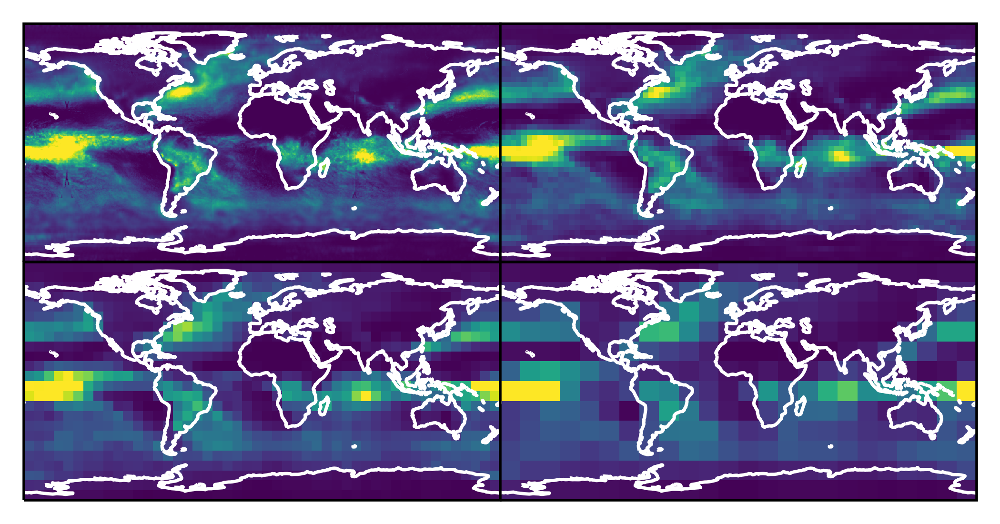

In [10]:
vmin = 0
vmax = 12

fig = plt.figure(figsize=2*np.array([2, 1]), dpi=500)
gs0 = fig.add_gridspec(2, 2, wspace=0.0, hspace=0, left=0, right=1, bottom=0, top=1)

ax = fig.add_subplot(gs0[0, 0], projection=ccrs.PlateCarree())
geo_data.satellite_precip.isel(time=0).plot(ax=ax, add_colorbar=False, vmin=vmin, vmax=vmax, add_labels=False)
ax.coastlines(color='w')

geo_data_coarse = geo_data.coarsen(lon=8, lat=8, boundary='pad').mean()
ax = fig.add_subplot(gs0[0, 1], projection=ccrs.PlateCarree())
geo_data_coarse.satellite_precip.isel(time=0).plot(ax=ax, add_colorbar=False, vmin=vmin, vmax=vmax, add_labels=False)
ax.coastlines(color='w')

geo_data_coarse = geo_data.coarsen(lon=15, lat=15, boundary='pad').mean()
ax = fig.add_subplot(gs0[1, 0], projection=ccrs.PlateCarree())
geo_data_coarse.satellite_precip.isel(time=0).plot(ax=ax, add_colorbar=False, vmin=vmin, vmax=vmax, add_labels=False)
ax.coastlines(color='w')

geo_data_coarse = geo_data.coarsen(lon=30, lat=30, boundary='pad').mean()
ax = fig.add_subplot(gs0[1, 1], projection=ccrs.PlateCarree())
geo_data_coarse.satellite_precip.isel(time=0).plot(ax=ax, add_colorbar=False, vmin=vmin, vmax=vmax, add_labels=False)
ax.coastlines(color='w')

## Read Sunspot Data and create xarray

In [11]:
# Define path
snDataPath = '../../data/Sunspot Number/SN_m_tot_V2.0.csv'

# Read cr monthly average file with custom column names
colnames=['year', 'month', 'FracYear', 'SN', 'crsd', 'NObs', 'prov'] 
sn = pd.read_csv(snDataPath, delimiter=';', names=colnames)
sn['day'] = 15
sn['time'] = pd.to_datetime(sn.loc[:,['year', 'month', 'day']])
sn = sn.set_index('time', drop=True)
sn = sn.to_xarray().convert_calendar("noleap")

# Convert to seasonal average
month_length = sn.time.dt.days_in_month
sn = ((sn['SN'] * month_length).resample(time='QS-DEC').sum() / 
          month_length.resample(time='QS-DEC').sum()).to_dataset(name = 'sn')

# sn['SNav'] = sn['SN'].rolling(time=12, min_periods=1, center=True).mean()
# sn = sn.sel(time=slice(np.min(hist_sol.time.data)-pd.Timedelta(0, 'd'), np.max(hist_sol.time.data)))

# Reset index to middle of the season
sn['time'] = sn['time'] + pd.to_timedelta(45, 'd')
# Select only whole seasons
sn = sn.sel(time=slice('1983-01-01', '2022-09-30'))
sn['time'] = xr.CFTimeIndex.to_datetimeindex(sn['time'], unsafe=True)

sn


<xarray.Dataset>
Dimensions:  (time: 159)
Coordinates:
  * time     (time) datetime64[ns] 1983-01-15 1983-04-15 ... 2022-07-16
Data variables:
    sn       (time) float64 120.7 110.3 111.9 62.81 ... 41.13 61.24 86.39 78.86

## Read Neutron Monitor Data and create xarray

In [12]:
# Define path
crDataPath = '../../data/Cosmic Rays/OULU_1964_04_01 _00_00_2023_04_12 _23_30.csv'

# Read cr monthly average file with custom column names\
cr = pd.read_csv(crDataPath)
cr['time'] = pd.to_datetime(cr['Timestamp']).dt.tz_localize(None)
cr = cr.set_index('time', drop=True)
cr = cr.to_xarray().convert_calendar("noleap")
# cr['crav'] = cr['CorrectedCountRate[cts/min]'].rolling(time=365, min_periods=1, center=True).mean()
# cr = cr.sel(time=slice(np.min(hist_sol.time.data)-pd.Timedelta(0, 'd'), np.max(hist_sol.time.data)))

# Convert to seasonal average
cr = cr['CorrectedCountRate[cts/min]'].resample(time='QS-DEC').mean().to_dataset(name = 'cr')

# Reset index to middle of the season
cr['time'] = cr['time'] + pd.to_timedelta(45, 'd')
# Select only whole seasons
cr = cr.sel(time=slice('1983-01-01', '2022-09-30'))
cr['time'] = xr.CFTimeIndex.to_datetimeindex(cr['time'], unsafe=True)

cr

<xarray.Dataset>
Dimensions:  (time: 159)
Coordinates:
  * time     (time) datetime64[ns] 1983-01-15 1983-04-15 ... 2022-07-16
Data variables:
    cr       (time) float64 5.508e+03 5.711e+03 ... 6.555e+03 6.334e+03

## Plot solar data

(4762.0, 19189.0)

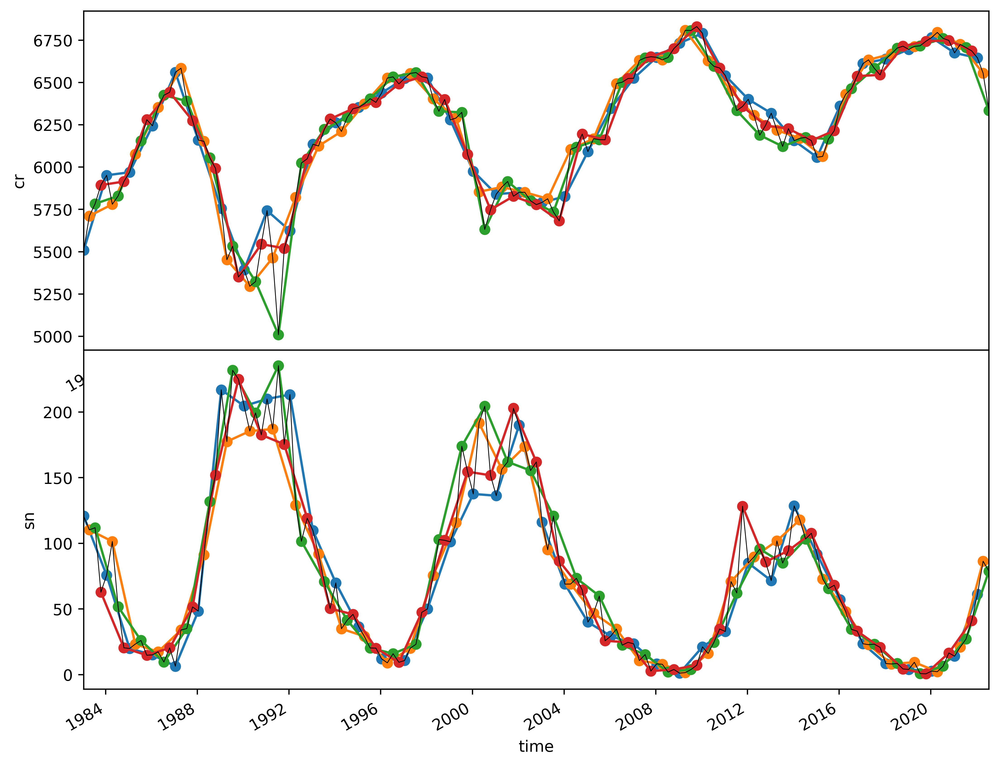

In [15]:
months = np.fromiter(geo_data.groupby('time.month').groups.keys(), dtype=int)

fig = plt.figure(figsize=2*np.array([4, 3]), dpi=500)
gs0 = fig.add_gridspec(2, 1, wspace=0.15, hspace=0, left=0, right=1, bottom=0, top=1)

ax = fig.add_subplot(gs0[0, 0])
cr_slice = cr.groupby('time.month')
for month in months:
    tt = cr_slice[month]['cr']
    tt.plot(ax=ax, marker='o')

cr['cr'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.nanmin(geo_data.time.data), np.nanmax(geo_data.time.data)])


ax = fig.add_subplot(gs0[1, 0])
sn_slice = sn.groupby('time.month')
for month in months:  
    tt = sn_slice[month]['sn']
    tt.plot(ax=ax, marker='o')

sn['sn'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([geo_data.time.data[0], geo_data.time.data[-1]])

## Run Bivariate analysis

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

####### analysing target with index 0 from list [0]

Target: 0 - testing sources [1]

---------------------------- (1) include target candidates
candidate set: [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24)]
testing candidate: (0, 12) 
maximum statistic, n_perm: 200
testing candidate: (0, 5) maximum statistic, n_perm: 200
 -- not significant

---------------------------- (2) include source candidates
candidate set current source: [(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (1, 10), (1, 11), (1, 12), (1, 13), (1, 14), (1, 15), (1, 16), (1, 17), (1, 18), (1, 19), (1, 20), (1, 21), (1, 22), (1, 23), (1, 24)]
testing candidate: (1, 13) maximum statistic, n_perm: 200
testing candidate: (1, 18) maximum statistic

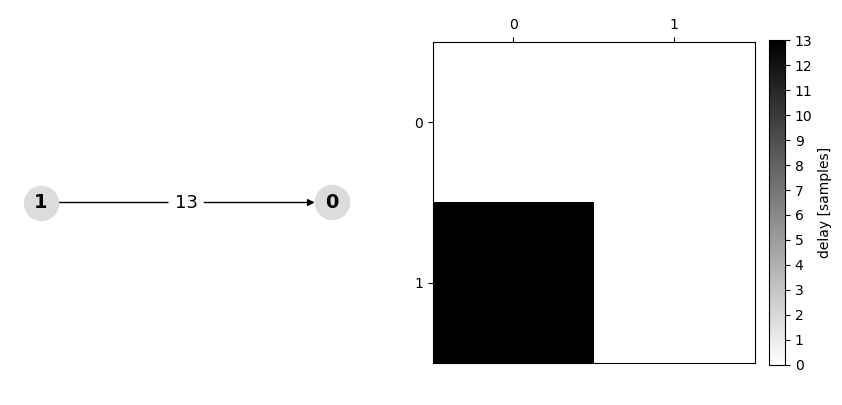

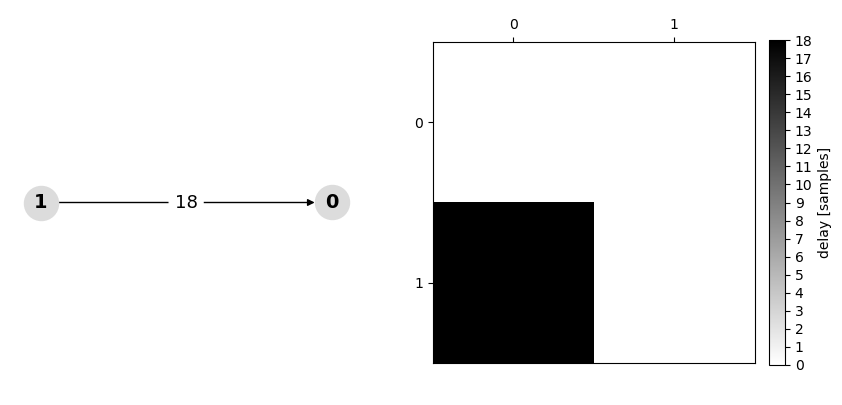

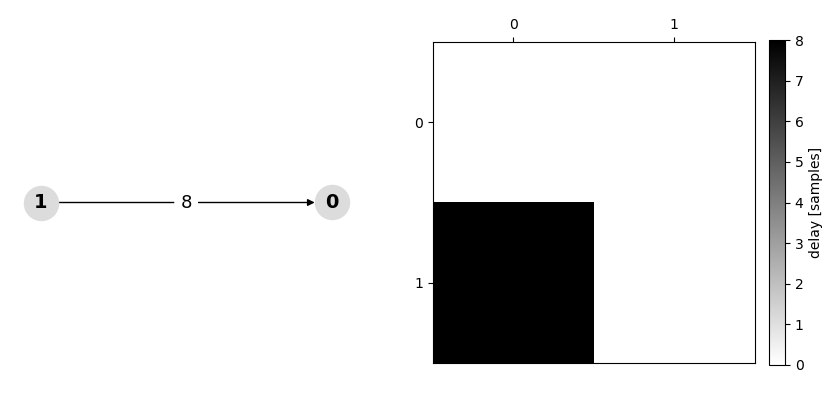

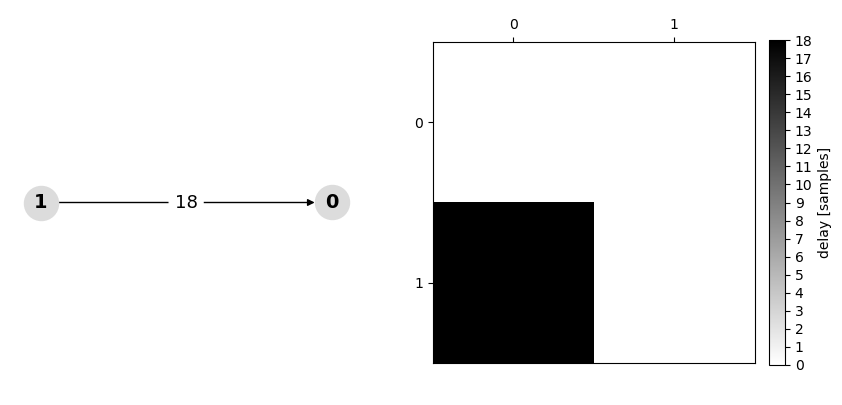

In [129]:
network_analysis = BivariateTE()
settings = {'cmi_estimator': 'JidtGaussianCMI',
            'max_lag': 24,
            'max_lag_sources': 24,
            'min_lag_sources': 1}

# settings = {'cmi_estimator': 'OpenCLKraskovCMI',
#             'max_lag': 24,
#             'max_lag_sources': 24,
#             'min_lag_sources': 1}

# settings = {'cmi_estimator': 'JidtKraskovCMI',
#             'max_lag': 24,
#             'max_lag_sources': 24,
#             'min_lag_sources': 1}

# settings = {'cmi_estimator': 'NumbaCudaKraskovCMI',
#             'max_lag': 24,
#             'max_lag_sources': 24,
#             'min_lag_sources': 1}

sn_slice = sn.groupby('time.month')
cr_slice = cr.groupby('time.month')
for month in months:
    dataList = [cr_slice[month]['cr'].data, sn_slice[month]['sn'].data]
    idt_data = Data(np.column_stack((itertools.zip_longest(*dataList, fillvalue=0))), dim_order='ps')
    results = network_analysis.analyse_network(settings=settings, data=idt_data, sources=[1], targets=[0])

    results.print_edge_list(weights='max_te_lag', fdr=False)
    plot_network(results=results, weights='max_te_lag', fdr=False)
    results.get_adjacency_matrix('max_te_lag', fdr=False).print_matrix()

            

## Select a random month, latitude, and longitude and plot

(4762.0, 19189.0)

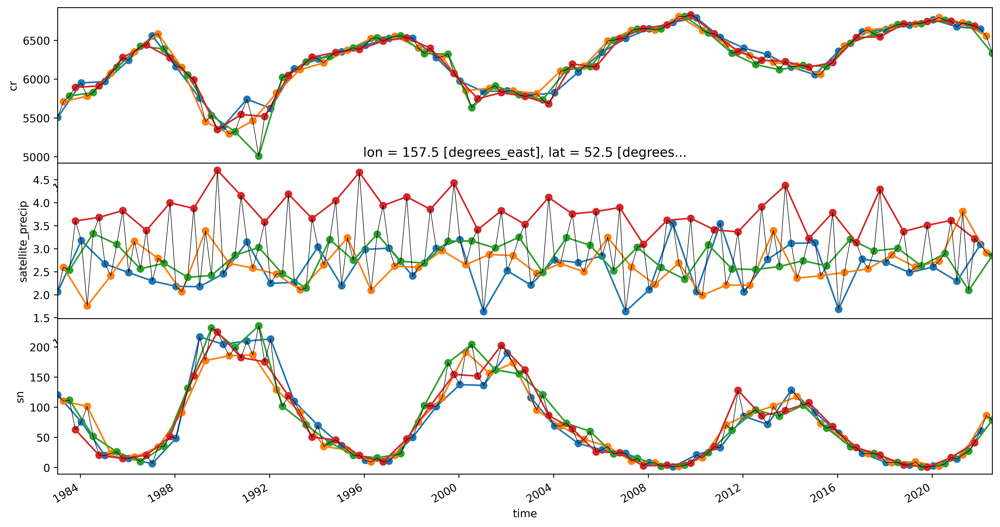

In [116]:
months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
month = np.random.choice(months)
lat = geo_data_coarse.lat.data[np.random.randint(0, geo_data_coarse.lat.shape[0]-1)]
lon = geo_data_coarse.lon.data[np.random.randint(0, geo_data_coarse.lon.shape[0]-1)]


fig = plt.figure(figsize=2*np.array([6, 3]), dpi=500)
gs0 = fig.add_gridspec(3, 1, wspace=0.15, hspace=0, left=0, right=1, bottom=0, top=1)


ax = fig.add_subplot(gs0[0, 0])
cr_slice = cr.groupby('time.month')
for month in months:  
    cr_slice[month]['cr'].plot(ax=ax, marker='o')

cr['cr'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])



ax = fig.add_subplot(gs0[1, 0])

geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
for month in months:
    geo_slice[month]['satellite_precip'].plot(ax=ax, marker='o')

geo_data_coarse['satellite_precip'].groupby('lat')[lat].groupby('lon')[lon].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])


ax = fig.add_subplot(gs0[2, 0])
sn_slice = sn.groupby('time.month')
for month in months:  
    sn_slice[month]['sn'].plot(ax=ax, marker='o')

sn['sn'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])

## Run Bivariate analysis with Sunspot number on random latitude and longitude

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

####### analysing target with index 0 from list [0]

Target: 0 - testing sources [1]

---------------------------- (1) include target candidates
candidate set: [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24)]
testing candidate: (0, 9) 
maximum statistic, n_perm: 200
 -- not significant

No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates
candidate set current source: [(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (1, 10), (1, 11), (1, 12), (1, 13), (1, 14), (1, 15), (1, 16), (1, 17), (1, 18), (1, 19), (1, 20), (1, 21), (1, 22), (1, 23), (1, 24)]
testing candidate: (1, 5) maximum statistic, n_perm: 200
 -- not significant

--

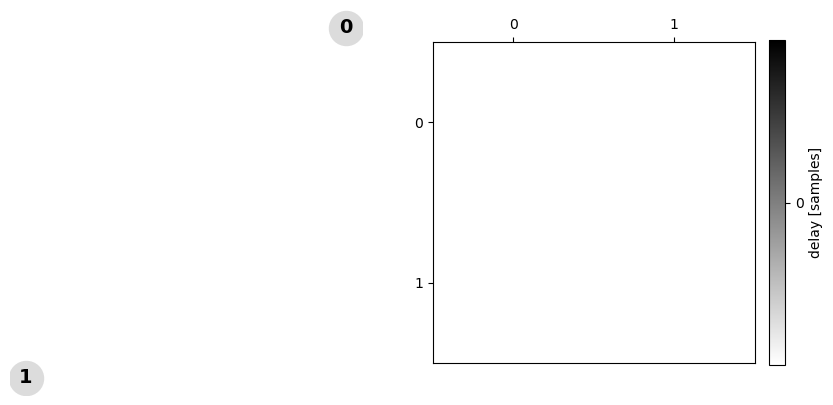

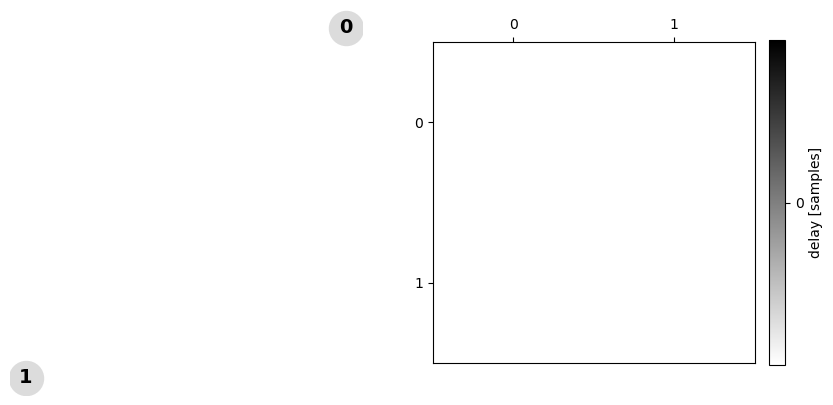

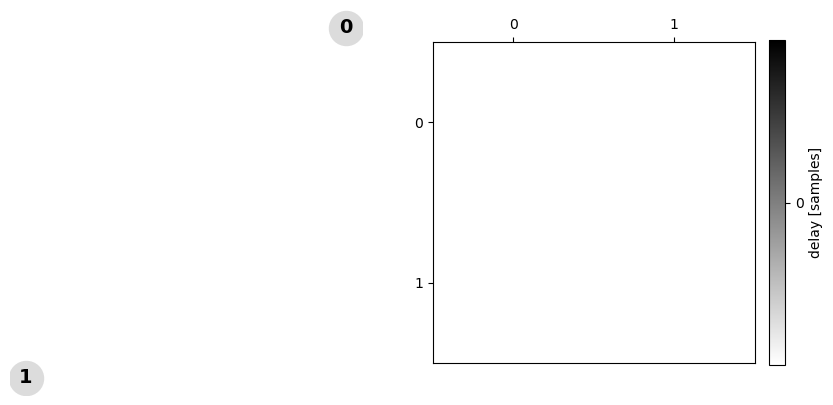

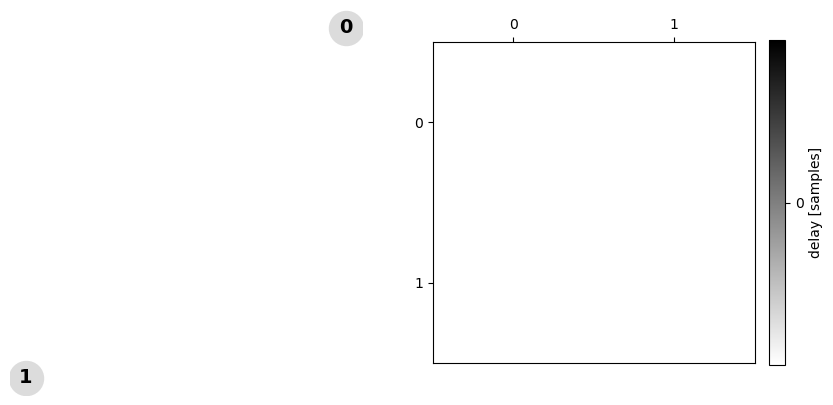

In [127]:
network_analysis = BivariateTE()
settings = {'cmi_estimator': 'JidtGaussianCMI',
            'max_lag': 24,
            'max_lag_sources': 24,
            'min_lag_sources': 1}

# settings = {'cmi_estimator': 'OpenCLKraskovCMI',
#             'max_lag': 24,
#             'max_lag_sources': 24,
#             'min_lag_sources': 1}



geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
sn_slice = sn.groupby('time.month')
for month in months:
    dataList = [geo_slice[month]['satellite_precip'].data.reshape(-1), sn_slice[month]['sn'].data]
    idt_data = Data(np.column_stack((itertools.zip_longest(*dataList, fillvalue=0))), dim_order='ps')
    results = network_analysis.analyse_network(settings=settings, data=idt_data, sources=[1], targets=[0])

    results.print_edge_list(weights='max_te_lag', fdr=False)
    plot_network(results=results, weights='max_te_lag', fdr=False)
    results.get_adjacency_matrix('max_te_lag', fdr=False).print_matrix()

            

## Run Bivariate analysis with Cosmic rays on random latitude and longitude

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

####### analysing target with index 0 from list [0]

Target: 0 - testing sources [1]

---------------------------- (1) include target candidates
candidate set: [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24)]
testing candidate: (0, 18) 
maximum statistic, n_perm: 200
testing candidate: (0, 6) maximum statistic, n_perm: 200
 -- not significant

---------------------------- (2) include source candidates
candidate set current source: [(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (1, 10), (1, 11), (1, 12), (1, 13), (1, 14), (1, 15), (1, 16), (1, 17), (1, 18), (1, 19), (1, 20), (1, 21), (1, 22), (1, 23), (1, 24)]
testing candidate: (1, 13) maximum statistic, n_perm: 200
testing candidate: (1, 12) maximum statistic

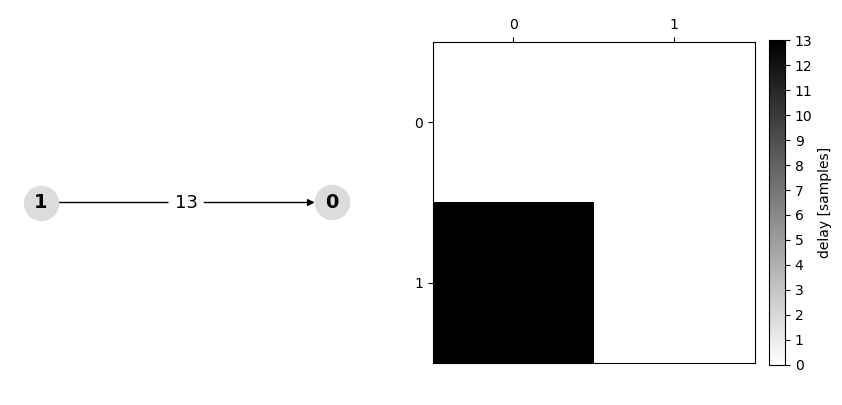

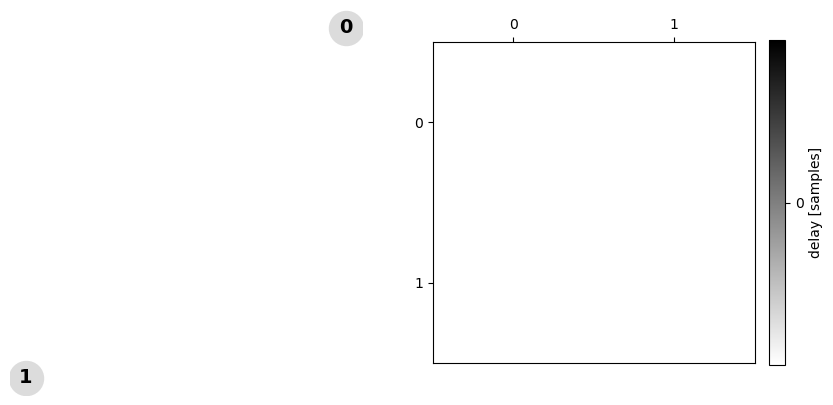

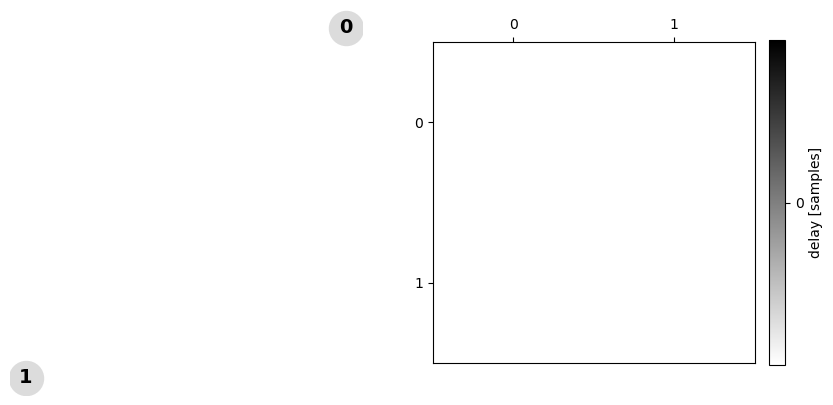

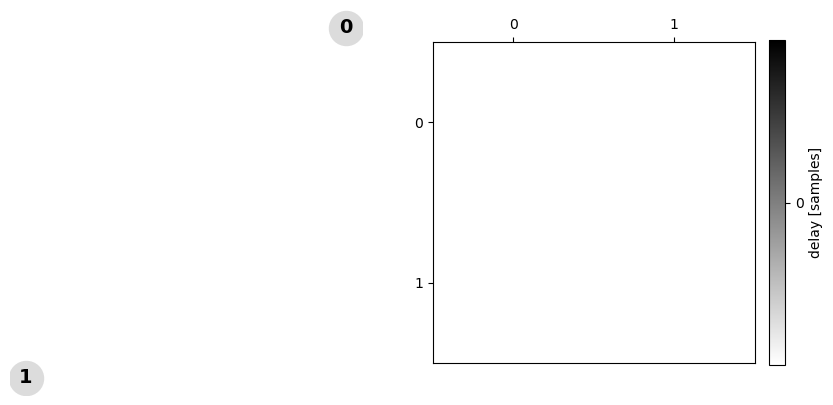

In [62]:
network_analysis = BivariateTE()
settings = {'cmi_estimator': 'JidtGaussianCMI',
            'max_lag': 24,
            'max_lag_sources': 24,
            'min_lag_sources': 1}

# settings = {'cmi_estimator': 'OpenCLKraskovCMI',
#             'max_lag': 24,
#             'max_lag_sources': 24,
#             'min_lag_sources': 1}



geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
cr_slice = cr.groupby('time.month')
for month in months:
    dataList = [geo_slice[month]['satellite_precip'].data.reshape(-1), cr_slice[month]['cr'].data]
    idt_data = Data(np.column_stack((itertools.zip_longest(*dataList, fillvalue=0))), dim_order='ps')
    results = network_analysis.analyse_network(settings=settings, data=idt_data, sources=[1], targets=[0])

    results.print_edge_list(weights='max_te_lag', fdr=False)
    plot_network(results=results, weights='max_te_lag', fdr=False)

            

In [71]:
results.get_adjacency_matrix('max_te_lag', fdr=False).print_matrix()

[[False False]
 [False False]]
[[0 0]
 [0 0]]


In [92]:
np.zeros((geo_data_coarse['lon'].shape[0], geo_data_coarse['lat'].shape[0], months.shape[0], 2, 2))

array([[[[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        ...,


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]]],


        [[[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         [[0., 0.],
          [0., 0.]],

         

## Run Bivariate analysis with Sunspot number on all latitudes

In [165]:
months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
initalization = np.zeros((months.shape[0], geo_data_coarse['lat'].shape[0], geo_data_coarse['lon'].shape[0], 2, 2))

sn_causality = xr.Dataset(
    data_vars=dict(
        lag=(['season', 'lat', 'lon', 'source', 'target'], initalization)
    ),
    coords=dict(
        season=months,
        lat=(geo_data_coarse['lat'].data),
        lon=(geo_data_coarse['lon'].data),
        source=np.array([0,1]),
        target=np.array([0,1])
    ),
    attrs=dict(description="Granger causality."),
)
sn_causality

<xarray.Dataset>
Dimensions:  (season: 4, lat: 12, lon: 24, source: 2, target: 2)
Coordinates:
  * season   (season) int32 1 4 7 10
  * lat      (lat) float32 82.5 67.5 52.5 37.5 22.5 ... -37.5 -52.5 -67.5 -82.5
  * lon      (lon) float32 -172.5 -157.5 -142.5 -127.5 ... 142.5 157.5 172.5
  * source   (source) int32 0 1
  * target   (target) int32 0 1
Data variables:
    lag      (season, lat, lon, source, target) float64 0.0 0.0 0.0 ... 0.0 0.0
Attributes:
    description:  Granger causality.

In [166]:
network_analysis = BivariateTE()
settings = {'cmi_estimator': 'JidtGaussianCMI',
            'max_lag': 24,
            'max_lag_sources': 24,
            'min_lag_sources': 1,
            'verbose':False}

months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
sn_slice = sn.groupby('time.month')


for lon in tqdm(geo_data_coarse['lon'].data, desc="Longitude", position=0):
    for lat in tqdm(geo_data_coarse['lat'].data, desc="Latitude", position=1, leave=False):

        geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
        for month in months:
            dataList = [geo_slice[month]['satellite_precip'].data.reshape(-1), sn_slice[month]['sn'].data]
            idt_data = Data(np.column_stack((itertools.zip_longest(*dataList, fillvalue=0))), dim_order='ps')
            results = network_analysis.analyse_network(settings=settings, data=idt_data, sources=[1], targets=[0])
            edges = results.get_adjacency_matrix('max_te_lag', fdr=False).get_edge_list()

            if edges.shape[0] > 0:
                for edge in edges:
                    cr_causality['lag'].loc[dict(lon=lon, lat=lat, season=month, source=edge[0], target=edge[1])] = edge[2]
        

Longitude:   0%|          | 0/24 [00:00<?, ?it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  17%|█▋        | 2/12 [00:01<00:06,  1.46it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 4)]
selected candidates current source: [(1, 20)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 4)]
selected candidates current source: [(1, 20)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

------------------


---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
selected candidates current source: [(1, 4)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates
selected vars sources [(1, 18), (1, 2), (1, 15)]
selected candidates current source: [(1, 6), (1, 22), (1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected var

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  67%|██████▋   | 8/12 [00:05<00:02,  1.70it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  83%|████████▎ | 10/12 [00:06<00:01,  1.86it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:   4%|▍         | 1/24 [00:07<02:47,  7.30s/it]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

--------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics


Latitude:  50%|█████     | 6/12 [00:03<00:03,  1.65it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 22)]
selected candidates current source: [(1, 2)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


Latitude:  92%|█████████▏| 11/12 [00:06<00:00,  1.70it/s]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 

Longitude:   8%|▊         | 2/24 [00:14<02:36,  7.13s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:   8%|▊         | 1/12 [00:00<00:05,  1.84it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati

Latitude:  25%|██▌       | 3/12 [00:01<00:04,  1.80it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 4), (1, 7)]
selected candidates current source: [(1, 20), (1, 17)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 20), (1, 7)]
selected candidates current source: [(1, 4), (1, 17)]

---------------------------- (4) final statistics


Latitude:  42%|████▏     | 5/12 [00:02<00:04,  1.63it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  50%|█████     | 6/12 [00:03<00:03,  1.76it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 5)]
selected candidates current source: [(1, 19)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sourc


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 22)]
s


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

----------------------


---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati

Longitude:  12%|█▎        | 3/24 [00:21<02:26,  6.99s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:   8%|▊         | 1/12 [00:00<00:04,  2.58it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 21)]
s


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  25%|██▌       | 3/12 [00:01<00:04,  1.91it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  42%|████▏     | 5/12 [00:02<00:03,  1.80it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  17%|█▋        | 4/24 [00:27<02:14,  6.73s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  25%|██▌       | 3/12 [00:01<00:03,  2.36it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis

Latitude:  33%|███▎      | 4/12 [00:01<00:03,  2.17it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) pru


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15), (1, 0)]
selec


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------


---------------------------- (3) prune candidates
selected vars sources [(1, 2), (1, 19)]
selected candidates current source: [(1, 22), (1, 5)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

----------------------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  21%|██        | 5/24 [00:33<02:03,  6.52s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 


Latitude:  42%|████▏     | 5/12 [00:02<00:03,  1.89it/s]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis

Latitude:  50%|█████     | 6/12 [00:03<00:03,  1.87it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  58%|█████▊    | 7/12 [00:03<00:02,  1.94it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  67%|██████▋   | 8/12 [00:04<00:02,  1.93it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
selected candidates current source: [(1, 8)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 p


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
selected candidates current source: [(1, 4)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------

Longitude:  25%|██▌       | 6/24 [00:40<01:56,  6.48s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 


---------------------------- (3) prune candidates
selected vars sources [(1, 4)]
selected candidates current source: [(1, 20)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) pru


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  75%|███████▌  | 9/12 [00:05<00:01,  1.89it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates
selected vars sources [(1, 18)]
selected candidates current source: [(1, 6)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 

Longitude:  29%|██▉       | 7/24 [00:46<01:51,  6.54s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  25%|██▌       | 3/12 [00:01<00:04,  2.03it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  33%|███▎      | 4/12 [00:01<00:03,  2.02it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  42%|████▏     | 5/12 [00:02<00:03,  2.05it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
selected candidates current source: [(1, 8)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  83%|████████▎ | 10/12 [00:04<00:00,  2.06it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 19)]
selected candidates current source: [(1, 5)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)

Longitude:  33%|███▎      | 8/24 [00:52<01:42,  6.38s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:   8%|▊         | 1/12 [00:00<00:05,  2.12it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 21)]
selected candidates current source: [(1, 3)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  67%|██████▋   | 8/12 [00:04<00:02,  1.79it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates
selected vars sources [(1, 5)]
selected candidates current source: [(1, 19)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  38%|███▊      | 9/24 [00:58<01:35,  6.34s/it]


---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 5)]
selected candidates current source: [(1, 19)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  33%|███▎      | 4/12 [00:02<00:04,  1.93it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samp


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  42%|████▏     | 5/12 [00:02<00:04,  1.71it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 5)]
selected candid


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
selected candidates current source: [(1, 4)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 19)]
selected candidates current source: [(1, 5)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates
selected vars sources [(1, 7)]
selected candidates current source: [(1, 17)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis

Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 

Longitude:  42%|████▏     | 10/24 [01:05<01:31,  6.52s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - add


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 23), (1, 22)]
selected candidates current source: [(1, 1), (1, 2)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.



---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 23)]
selected candidates current source: [(1, 1)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  46%|████▌     | 11/24 [01:12<01:24,  6.52s/it][A

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


Latitude:  33%|███▎      | 4/12 [00:02<00:04,  1.86it/s]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sour


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
selected candidates current source: [(1, 4)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



Latitude: 100%|██████████| 12/12 [00:06<00:00,  2.03it/s]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  50%|█████     | 12/24 [01:18<01:16,  6.41s/it]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  33%|███▎      | 4/12 [00:01<00:03,  2.10it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
selected candidates current source: [(1, 4)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
selected candidates current source: [(1, 8)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  83%|████████▎ | 10/12 [00:05<00:01,  1.88it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  92%|█████████▏| 11/12 [00:05<00:00,  1.95it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sourc

Longitude:  54%|█████▍    | 13/24 [01:24<01:10,  6.38s/it]


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 7)]
selected candidates current source: [(1, 17)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
s


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  75%|███████▌  | 9/12 [00:04<00:01,  1.78it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 p

Longitude:  58%|█████▊    | 14/24 [01:31<01:03,  6.33s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:   8%|▊         | 1/12 [00:00<00:05,  2.06it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  17%|█▋        | 2/12 [00:00<00:04,  2.13it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3), (1, 20), (1, 18)]
selected candidates current source: [(1, 21), (1, 4), (1, 6)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replica


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  42%|████▏     | 5/12 [00:02<00:03,  1.77it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  67%|██████▋   | 8/12 [00:04<00:02,  1.87it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  62%|██████▎   | 15/24 [01:37<00:56,  6.28s/it]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  33%|███▎      | 4/12 [00:01<00:03,  2.12it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  58%|█████▊    | 7/12 [00:03<00:02,  2.17it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis

Latitude:  67%|██████▋   | 8/12 [00:03<00:01,  2.12it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 19)]
selected candidates current source: [(1, 5)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  67%|██████▋   | 16/24 [01:43<00:49,  6.15s/it][A

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



Latitude:   8%|▊         | 1/12 [00:00<00:05,  2.19it/s]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12), (1, 17)]
selected candidates current source: [(1, 12), (1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwritin


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 18)]
selected candidates current source: [(1, 6)]

---------------


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 p

Longitude:  71%|███████   | 17/24 [01:48<00:42,  6.05s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2), (1, 19)]
selected candidates current source: [(1, 22), (1, 5)]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
selected candidates current source: [(1, 4)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4

Longitude:  75%|███████▌  | 18/24 [01:55<00:36,  6.06s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:   8%|▊         | 1/12 [00:00<00:05,  2.16it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

--------------

Latitude:  33%|███▎      | 4/12 [00:02<00:04,  1.72it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


Latitude:  50%|█████     | 6/12 [00:03<00:03,  1.96it/s]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati

Longitude:  79%|███████▉  | 19/24 [02:01<00:30,  6.07s/it]


---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 8), (1, 13)]
selected candidates current source: [(1, 16), (1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  33%|███▎      | 4/12 [00:01<00:03,  2.08it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)

Latitude:  42%|████▏     | 5/12 [00:02<00:03,  2.09it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sourc


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

--


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  67%|██████▋   | 8/12 [00:04<00:02,  1.98it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati

Longitude:  83%|████████▎ | 20/24 [02:07<00:24,  6.06s/it][A

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:   8%|▊         | 1/12 [00:00<00:05,  2.16it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  17%|█▋        | 2/12 [00:00<00:04,  2.12it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 p


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  67%|██████▋   | 8/12 [00:03<00:01,  2.09it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  75%|███████▌  | 9/12 [00:04<00:01,  2.12it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the targe


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  88%|████████▊ | 21/24 [02:12<00:17,  6.00s/it][A

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:   8%|▊         | 1/12 [00:00<00:05,  2.19it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  17%|█▋        | 2/12 [00:00<00:04,  2.12it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)

Latitude:  25%|██▌       | 3/12 [00:01<00:04,  2.10it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  33%|███▎      | 4/12 [00:01<00:03,  2.10it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  42%|████▏     | 5/12 [00:02<00:03,  2.10it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  58%|█████▊    | 7/12 [00:03<00:02,  2.12it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 18)]
selected candidates current source: [(1, 6)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) i


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Latitude:  75%|███████▌  | 9/12 [00:04<00:01,  1.95it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  92%|█████████▏| 22/24 [02:18<00:11,  5.96s/it][A

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  33%|███▎      | 4/12 [00:02<00:04,  1.88it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  50%|█████     | 6/12 [00:03<00:03,  2.00it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)

Longitude:  96%|█████████▌| 23/24 [02:24<00:05,  5.95s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 18)]
selected candidates current source: [(1, 6)]

---------------

Latitude:   8%|▊         | 1/12 [00:00<00:05,  2.01it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 15)]
selected candidates current source: [(1, 9)]

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 22)]
s


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  67%|██████▋   | 8/12 [00:04<00:02,  1.87it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  75%|███████▌  | 9/12 [00:04<00:01,  1.94it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude: 100%|██████████| 24/24 [02:30<00:00,  6.28s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


### Plot sensitive candidates

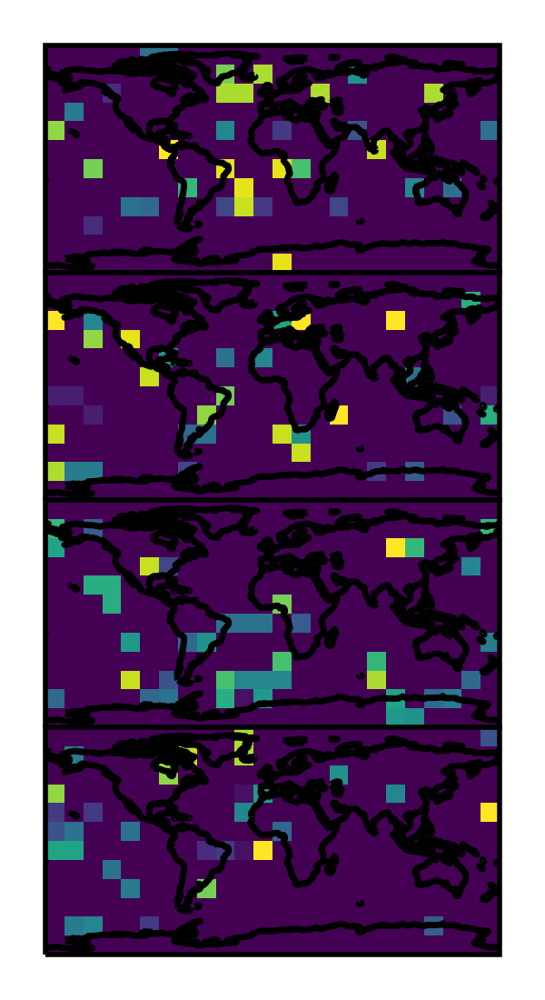

In [177]:
vmin = 0
vmax = 12
source=1
target=0

fig = plt.figure(figsize=2*np.array([2, 1]), dpi=500)
gs0 = fig.add_gridspec(4, 1, wspace=0.0, hspace=0, left=0, right=1, bottom=0, top=1)

ax = fig.add_subplot(gs0[0, 0], projection=ccrs.PlateCarree())
sn_causality.lag.loc[dict(season=1, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[1, 0], projection=ccrs.PlateCarree())
sn_causality.lag.loc[dict(season=4, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[2, 0], projection=ccrs.PlateCarree())
sn_causality.lag.loc[dict(season=7, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[3, 0], projection=ccrs.PlateCarree())
sn_causality.lag.loc[dict(season=10, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

In [214]:
sn_causality

<xarray.Dataset>
Dimensions:  (season: 4, lat: 12, lon: 24, source: 2, target: 2)
Coordinates:
  * season   (season) int32 1 4 7 10
  * lat      (lat) float32 82.5 67.5 52.5 37.5 22.5 ... -37.5 -52.5 -67.5 -82.5
  * lon      (lon) float32 -172.5 -157.5 -142.5 -127.5 ... 142.5 157.5 172.5
  * source   (source) int32 0 1
  * target   (target) int32 0 1
Data variables:
    lag      (season, lat, lon, source, target) float64 0.0 0.0 0.0 ... 0.0 0.0
Attributes:
    description:  Granger causality.

In [223]:
lag = sn_causality.lag
winter = lag.loc[dict(season=1, source=source, target=target)].squeeze()
spring = lag.loc[dict(season=4, source=source, target=target)].squeeze()
summer = lag.loc[dict(season=7, source=source, target=target)].squeeze()
fall = lag.loc[dict(season=10, source=source, target=target)].squeeze()

all_year = winter.where(np.logical_and(np.logical_and(np.logical_and(winter>0, spring>0), summer>0), fall>0))
all_year_stack = all_year.stack(notnull=['lat','lon']) 
all_year_stack = all_year_stack[all_year_stack.notnull()]

all_year_stack

<xarray.DataArray 'lag' (notnull: 1)>
array([23.])
Coordinates:
    season   int32 1
    source   int32 1
    target   int32 0
  * notnull  (notnull) object MultiIndex
  * lat      (notnull) float32 -7.5
  * lon      (notnull) float32 -37.5

(4762.0, 19189.0)

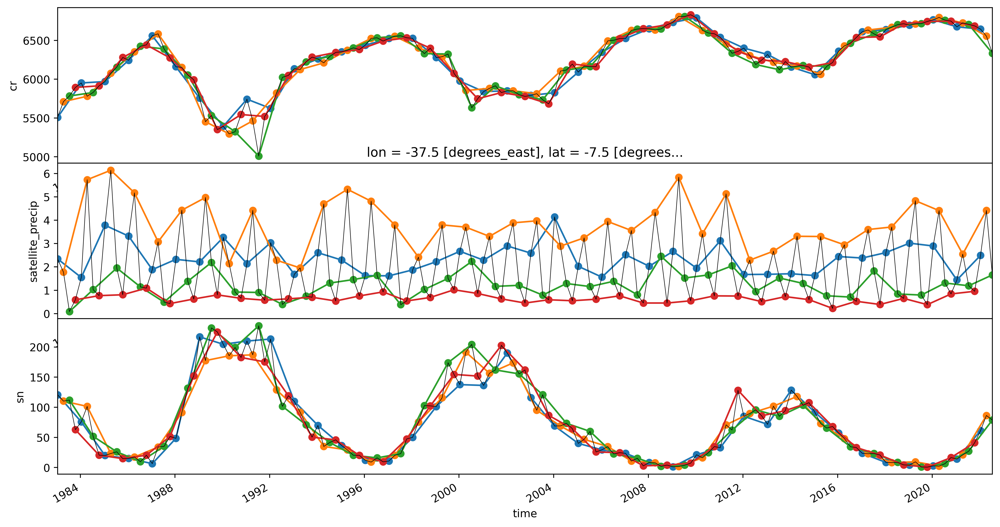

In [224]:
months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
month = np.random.choice(months)
lat = all_year_stack.lat.data[0]
lon = all_year_stack.lon.data[0]


fig = plt.figure(figsize=2*np.array([6, 3]), dpi=500)
gs0 = fig.add_gridspec(3, 1, wspace=0.15, hspace=0, left=0, right=1, bottom=0, top=1)


ax = fig.add_subplot(gs0[0, 0])
cr_slice = cr.groupby('time.month')
for month in months:  
    cr_slice[month]['cr'].plot(ax=ax, marker='o')

cr['cr'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])



ax = fig.add_subplot(gs0[1, 0])

geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
for month in months:
    geo_slice[month]['satellite_precip'].plot(ax=ax, marker='o')

geo_data_coarse['satellite_precip'].groupby('lat')[lat].groupby('lon')[lon].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])


ax = fig.add_subplot(gs0[2, 0])
sn_slice = sn.groupby('time.month')
for month in months:  
    sn_slice[month]['sn'].plot(ax=ax, marker='o')

sn['sn'].plot(ax=ax, c='k', lw=0.5)
ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])

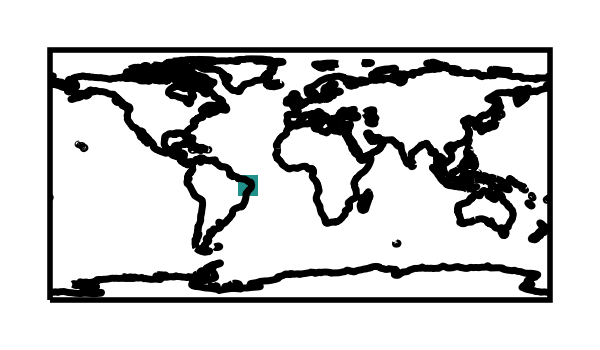

In [227]:
vmin = 0
vmax = 12
source=1
target=0

fig = plt.figure(figsize=2*np.array([2, 1]), dpi=500)
gs0 = fig.add_gridspec(4, 1, wspace=0.0, hspace=0, left=0, right=1, bottom=0, top=1)

ax = fig.add_subplot(gs0[0, 0], projection=ccrs.PlateCarree())
all_year.plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

### Plot random candidate sequence

In [192]:
# Find non-zero lags and associated coordinates
lag = sn_causality.lag
winter = lag.loc[dict(season=1, source=source, target=target)].squeeze()
winter = winter.where(winter>0)

winter_stacked = winter.stack(notnull=['lat','lon']) 
winter_non_zero = winter_stacked[winter_stacked.notnull()]

(4762.0, 19189.0)

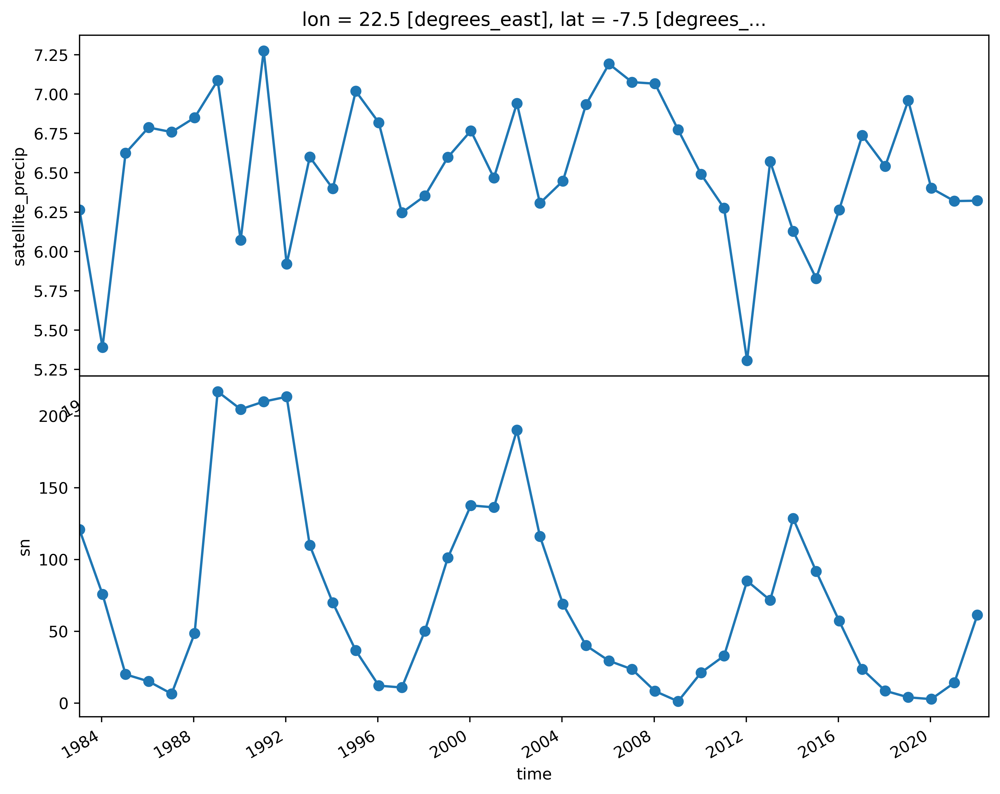

In [196]:
month = 1
rand_index = np.random.randint(0, winter_non_zero.lat.shape[0]-1)
lat = winter_non_zero.lat.data[rand_index]
lon = winter_non_zero.lon.data[rand_index]


fig = plt.figure(figsize=2*np.array([4, 3]), dpi=500)
gs0 = fig.add_gridspec(2, 1, wspace=0.15, hspace=0, left=0, right=1, bottom=0, top=1)


ax = fig.add_subplot(gs0[0, 0])

geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
geo_slice[month]['satellite_precip'].plot(ax=ax, marker='o')

ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])


ax = fig.add_subplot(gs0[1, 0])
sn_slice = sn.groupby('time.month')
sn_slice[month]['sn'].plot(ax=ax, marker='o')

ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])

## Run Bivariate analysis with cosmic rays on all latitudes

In [198]:
months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
initalization = np.zeros((months.shape[0], geo_data_coarse['lat'].shape[0], geo_data_coarse['lon'].shape[0], 2, 2))

cr_causality = xr.Dataset(
    data_vars=dict(
        lag=(['season', 'lat', 'lon', 'source', 'target'], initalization)
    ),
    coords=dict(
        season=months,
        lat=(geo_data_coarse['lat'].data),
        lon=(geo_data_coarse['lon'].data),
        source=np.array([0,1]),
        target=np.array([0,1])
    ),
    attrs=dict(description="Granger causality."),
)
cr_causality

<xarray.Dataset>
Dimensions:  (season: 4, lat: 12, lon: 24, source: 2, target: 2)
Coordinates:
  * season   (season) int32 1 4 7 10
  * lat      (lat) float32 82.5 67.5 52.5 37.5 22.5 ... -37.5 -52.5 -67.5 -82.5
  * lon      (lon) float32 -172.5 -157.5 -142.5 -127.5 ... 142.5 157.5 172.5
  * source   (source) int32 0 1
  * target   (target) int32 0 1
Data variables:
    lag      (season, lat, lon, source, target) float64 0.0 0.0 0.0 ... 0.0 0.0
Attributes:
    description:  Granger causality.

In [200]:
network_analysis = BivariateTE()
settings = {'cmi_estimator': 'JidtGaussianCMI',
            'max_lag': 24,
            'max_lag_sources': 24,
            'min_lag_sources': 1,
            'verbose':False}

months = np.fromiter(geo_data_coarse.groupby('time.month').groups.keys(), dtype=int)
cr_slice = cr.groupby('time.month')


for lon in tqdm(geo_data_coarse['lon'].data, desc="Longitude", position=0):
    for lat in tqdm(geo_data_coarse['lat'].data, desc="Latitude", position=1, leave=False):

        geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
        for month in months:
            dataList = [geo_slice[month]['satellite_precip'].data.reshape(-1), cr_slice[month]['cr'].data]
            idt_data = Data(np.column_stack((itertools.zip_longest(*dataList, fillvalue=0))), dim_order='ps')
            results = network_analysis.analyse_network(settings=settings, data=idt_data, sources=[1], targets=[0])
            edges = results.get_adjacency_matrix('max_te_lag', fdr=False).get_edge_list()

            if edges.shape[0] > 0:
                for edge in edges:
                    cr_causality['lag'].loc[dict(lon=lon, lat=lat, season=month, source=edge[0], target=edge[1])] = edge[2]
        

Longitude:   0%|          | 0/24 [00:00<?, ?it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------

Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  25%|██▌       | 3/12 [00:02<00:06,  1.37it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates
selected vars sources [(1, 23), (1, 19)]
selected candidates current source: [(1, 1), (1, 5)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics


Latitude:  50%|█████     | 6/12 [00:04<00:04,  1.38it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 22)]
selected candidates current source: [(1, 2)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  75%|███████▌  | 9/12 [00:06<00:02,  1.39it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  83%|████████▎ | 10/12 [00:07<00:01,  1.40it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis

Longitude:   4%|▍         | 1/24 [00:08<03:23,  8.86s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
selected candidates current source: [(1, 8)]

---------------------------- (4) final statistics


Latitude:  50%|█████     | 6/12 [00:03<00:03,  1.69it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 23)]
selected candidates current source: [(1, 1)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates
selected vars sources [(1, 23)]
selected candidates current source: [(1, 1)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics


Latitude:  83%|████████▎ | 10/12 [00:06<00:01,  1.61it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:   8%|▊         | 2/24 [00:15<02:51,  7.80s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  33%|███▎      | 4/12 [00:02<00:04,  1.66it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 11)]
selected candidates current source: [(1, 13)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  58%|█████▊    | 7/12 [00:04<00:03,  1.66it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 22)]
selected candidates current source: [(1, 2)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  67%|██████▋   | 8/12 [00:05<00:02,  1.49it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  83%|████████▎ | 10/12 [00:06<00:01,  1.42it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  12%|█▎        | 3/24 [00:23<02:42,  7.73s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  17%|█▋        | 2/12 [00:01<00:07,  1.35it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  33%|███▎      | 4/12 [00:02<00:05,  1.52it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  83%|████████▎ | 10/12 [00:07<00:01,  1.38it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sourc


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  17%|█▋        | 4/24 [00:31<02:38,  7.95s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  25%|██▌       | 3/12 [00:02<00:06,  1.47it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 19)]
selected candidates current source: [(1, 5)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 p


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  21%|██        | 5/24 [00:39<02:31,  7.96s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
selected candidates current source: [(1, 4)]

---------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  50%|█████     | 6/12 [00:04<00:04,  1.36it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  92%|█████████▏| 11/12 [00:08<00:00,  1.36it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 

Longitude:  25%|██▌       | 6/24 [00:48<02:27,  8.17s/it]



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates
selected vars sources [(1, 3), (1, 1)]
selected candidates current source: [(1, 21), (1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties:


---------------------------- (3) prune candidates
selected vars sources [(1, 4)]
selected candidates current source: [(1, 20)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 


---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  50%|█████     | 6/12 [00:04<00:04,  1.35it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  75%|███████▌  | 9/12 [00:06<00:02,  1.46it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates
selected vars sources [(1, 7)]
selected candidates current source: [(1, 17)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
selected candidates current source: [(1, 8)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  92%|█████████▏| 11/12 [00:07<00:00,  1.52it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 

Longitude:  29%|██▉       | 7/24 [00:56<02:20,  8.26s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 21)]
selected candidates current source: [(1, 3)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  42%|████▏     | 5/12 [00:03<00:04,  1.55it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 21)]
selected candidates current source: [(1, 3)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------

Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da

Longitude:  33%|███▎      | 8/24 [01:05<02:12,  8.26s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 

Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 7)]
selected candidates current source: [(1, 17)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  50%|█████     | 6/12 [00:04<00:04,  1.41it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

-------


---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 10), (1, 2)]
selec


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
selected candidates current source: [(1, 8)]

---------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  38%|███▊      | 9/24 [01:13<02:05,  8.34s/it]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  33%|███▎      | 4/12 [00:02<00:05,  1.45it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data




---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  50%|█████     | 6/12 [00:04<00:04,  1.33it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 5)]
selected candidates current source: [(1, 19)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  67%|██████▋   | 8/12 [00:05<00:02,  1.41it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sourc


---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 

Longitude:  42%|████▏     | 10/24 [01:22<01:59,  8.51s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics


Latitude:  33%|███▎      | 4/12 [00:02<00:05,  1.35it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics


Latitude:  42%|████▏     | 5/12 [00:03<00:04,  1.43it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
selected candidates current source: [(1, 8)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics


Latitude:  58%|█████▊    | 7/12 [00:04<00:03,  1.36it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  75%|███████▌  | 9/12 [00:06<00:02,  1.44it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  83%|████████▎ | 10/12 [00:07<00:01,  1.38it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  92%|█████████▏| 11/12 [00:07<00:00,  1.29it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  46%|████▌     | 11/24 [01:31<01:50,  8.54s/it][A

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:   8%|▊         | 1/12 [00:00<00:06,  1.63it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  25%|██▌       | 3/12 [00:02<00:06,  1.49it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 7)]
selected candidates current source: [(1, 17)]

---------------------------- (4) final statistics


Latitude:  33%|███▎      | 4/12 [00:02<00:06,  1.33it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  42%|████▏     | 5/12 [00:03<00:05,  1.28it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  67%|██████▋   | 8/12 [00:05<00:02,  1.41it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  50%|█████     | 12/24 [01:39<01:43,  8.58s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:   8%|▊         | 1/12 [00:00<00:06,  1.59it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  17%|█▋        | 2/12 [00:01<00:06,  1.55it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 10)]
selected candidates current source: [(1, 14)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data




---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 18)]
selected candidates current source: [(1, 6)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics


Latitude:  50%|█████     | 6/12 [00:04<00:04,  1.42it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  58%|█████▊    | 7/12 [00:04<00:03,  1.46it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 12)]
selected candidates current source: [(1, 12)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) pr

Longitude:  54%|█████▍    | 13/24 [01:48<01:34,  8.63s/it]


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
selected candidates current source: [(1, 4)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
s


---------------------------- (3) prune candidates
selected vars sources [(1, 16)]
selected candidates current source: [(1, 8)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candid


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 5)]
selected candidates current source: [(1, 19)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2), (1, 14)]
selected candidates current source: [(1, 22), (1, 10)]

---------------------------- (


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  58%|█████▊    | 14/24 [01:57<01:28,  8.82s/it][A

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  17%|█▋        | 2/12 [00:01<00:06,  1.63it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  58%|█████▊    | 7/12 [00:04<00:03,  1.54it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

--


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  83%|████████▎ | 10/12 [00:06<00:01,  1.67it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 18)]
selected candidates current source: [(1, 6)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 p


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  62%|██████▎   | 15/24 [02:05<01:16,  8.46s/it][A

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 13)]
selected candidates current source: [(1, 11)]

---------------------------- (4) final statistics


Latitude:  25%|██▌       | 3/12 [00:02<00:06,  1.42it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

--


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 20)]
selected candidates current source: [(1, 4)]

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  83%|████████▎ | 10/12 [00:06<00:01,  1.71it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)

Longitude:  67%|██████▋   | 16/24 [02:12<01:05,  8.13s/it]


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

--------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  33%|███▎      | 4/12 [00:02<00:04,  1.74it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 7)]
selected candidates current source: [(1, 17)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  42%|████▏     | 5/12 [00:03<00:04,  1.54it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  92%|█████████▏| 11/12 [00:06<00:00,  1.57it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  71%|███████   | 17/24 [02:20<00:55,  7.93s/it][A

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final stati


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 11), (1, 0)]
selected candidates current source: [(1, 13), (1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 2)]
selected candidates current source: [(1, 22)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  50%|█████     | 6/12 [00:03<00:04,  1.45it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  58%|█████▊    | 7/12 [00:04<00:03,  1.50it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates
selected vars sources [(1, 21)]
selected candidates current source: [(1, 3)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  83%|████████▎ | 10/12 [00:06<00:01,  1.62it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  92%|█████████▏| 11/12 [00:07<00:00,  1.52it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates




No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  75%|███████▌  | 18/24 [02:27<00:47,  7.86s/it][A

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 


---------------------------- (3) prune candidates
selected vars sources [(1, 1)]
selected candidates current source: [(1, 23)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistic


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 16), (1, 13)]
selected candidates current source: [(1, 8), (1, 11)]

---------------------------- (4) final statistics


Latitude:  33%|███▎      | 4/12 [00:02<00:06,  1.26it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statis



No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

--


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates
selected vars sources [(1, 6)]
selected candidates current source: [(1, 18)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Longitude:  79%|███████▉  | 19/24 [02:35<00:39,  7.90s/it]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  25%|██▌       | 3/12 [00:01<00:04,  1.84it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  33%|███▎      | 4/12 [00:02<00:04,  1.85it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  92%|█████████▏| 11/12 [00:06<00:00,  1.61it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample 

Longitude:  83%|████████▎ | 20/24 [02:43<00:30,  7.69s/it]


---------------------------- (3) prune candidates
selected vars sources [(1, 6)]
selected candidates current source: [(1, 18)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  17%|█▋        | 2/12 [00:01<00:06,  1.62it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 3)]
selected candidates current source: [(1, 21)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

-


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 9)]
selected candidates current source: [(1, 15)]

---------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  58%|█████▊    | 7/12 [00:04<00:03,  1.52it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---

Longitude:  88%|████████▊ | 21/24 [02:50<00:22,  7.58s/it]


---------------------------- (3) prune candidates
selected vars sources [(1, 6)]
selected candidates current source: [(1, 18)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  33%|███▎      | 4/12 [00:02<00:05,  1.39it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  58%|█████▊    | 7/12 [00:05<00:03,  1.43it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 7)]
selected candidates current source: [(1, 17)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sourc


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 6)]
selected candidates current source: [(1, 18)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  83%|████████▎ | 10/12 [00:07<00:01,  1.40it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 

Longitude:  92%|█████████▏| 22/24 [02:58<00:15,  7.83s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  17%|█▋        | 2/12 [00:01<00:06,  1.59it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing da


---------------------------- (3) prune candidates
selected vars sources [(1, 14)]
selected candidates current source: [(1, 10)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  33%|███▎      | 4/12 [00:02<00:05,  1.57it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  42%|████▏     | 5/12 [00:03<00:04,  1.58it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates



---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  75%|███████▌  | 9/12 [00:05<00:01,  1.65it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates
selected vars sources [(1, 17)]
selected candidates current source: [(1, 7)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  83%|████████▎ | 10/12 [00:06<00:01,  1.52it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4)

Longitude:  96%|█████████▌| 23/24 [03:06<00:07,  7.72s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 8)]
selected candidates current source: [(1, 16)]

---------------------------- (4) final statistics


Latitude:  25%|██▌       | 3/12 [00:01<00:05,  1.70it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates
selected vars sources [(1, 0)]
selected candidates current source: [(1, 24)]

---------------------------- (4) final statistics
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

----------------


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (1) include target candidates


---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  67%|██████▋   | 8/12 [00:05<00:02,  1.41it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data 


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 39 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


Latitude:  92%|█████████▏| 11/12 [00:06<00:00,  1.62it/s]

Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target candidates


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...
Adding data with properties: 2 processes, 40 samples, 1 replications
overwriting existing data

---------------------------- (1) include target 

Longitude: 100%|██████████| 24/24 [03:13<00:00,  8.08s/it]


No informative sources in the target's past - adding target sample with lag 1.

---------------------------- (2) include source candidates

---------------------------- (3) prune candidates

---------------------------- (4) final statistics
No links in final results ...


### Plot sensitive candidates

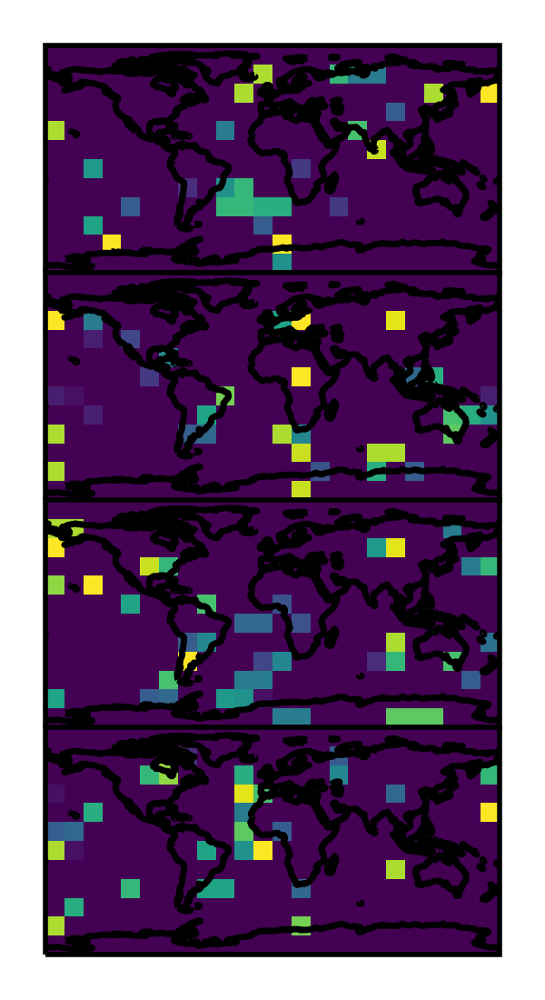

In [201]:
vmin = 0
vmax = 12
source=1
target=0

fig = plt.figure(figsize=2*np.array([2, 1]), dpi=500)
gs0 = fig.add_gridspec(4, 1, wspace=0.0, hspace=0, left=0, right=1, bottom=0, top=1)

ax = fig.add_subplot(gs0[0, 0], projection=ccrs.PlateCarree())
cr_causality.lag.loc[dict(season=1, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[1, 0], projection=ccrs.PlateCarree())
cr_causality.lag.loc[dict(season=4, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[2, 0], projection=ccrs.PlateCarree())
cr_causality.lag.loc[dict(season=7, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

ax = fig.add_subplot(gs0[3, 0], projection=ccrs.PlateCarree())
cr_causality.lag.loc[dict(season=10, source=source, target=target)].plot(ax=ax, add_colorbar=False, add_labels=False)
ax.coastlines(color='k')

In [228]:
lag = cr_causality.lag
winter = lag.loc[dict(season=1, source=source, target=target)].squeeze()
spring = lag.loc[dict(season=4, source=source, target=target)].squeeze()
summer = lag.loc[dict(season=7, source=source, target=target)].squeeze()
fall = lag.loc[dict(season=10, source=source, target=target)].squeeze()

all_year = winter.where(np.logical_and(np.logical_and(np.logical_and(winter>0, spring>0), summer>0), fall>0))
all_year_stack = all_year.stack(notnull=['lat','lon']) 
all_year_stack = all_year_stack[all_year_stack.notnull()]

all_year_stack

<xarray.DataArray 'lag' (notnull: 0)>
array([], dtype=float64)
Coordinates:
    season   int32 1
    source   int32 1
    target   int32 0
  * notnull  (notnull) object MultiIndex
  * lat      (notnull) float32 
  * lon      (notnull) float32

### Plot random candidate sequence

In [202]:
# Find non-zero lags and associated coordinates
lag = cr_causality.lag
winter = lag.loc[dict(season=1, source=source, target=target)].squeeze()
winter = winter.where(winter>0)

winter_stacked = winter.stack(notnull=['lat','lon']) 
winter_non_zero = winter_stacked[winter_stacked.notnull()]

(4762.0, 19189.0)

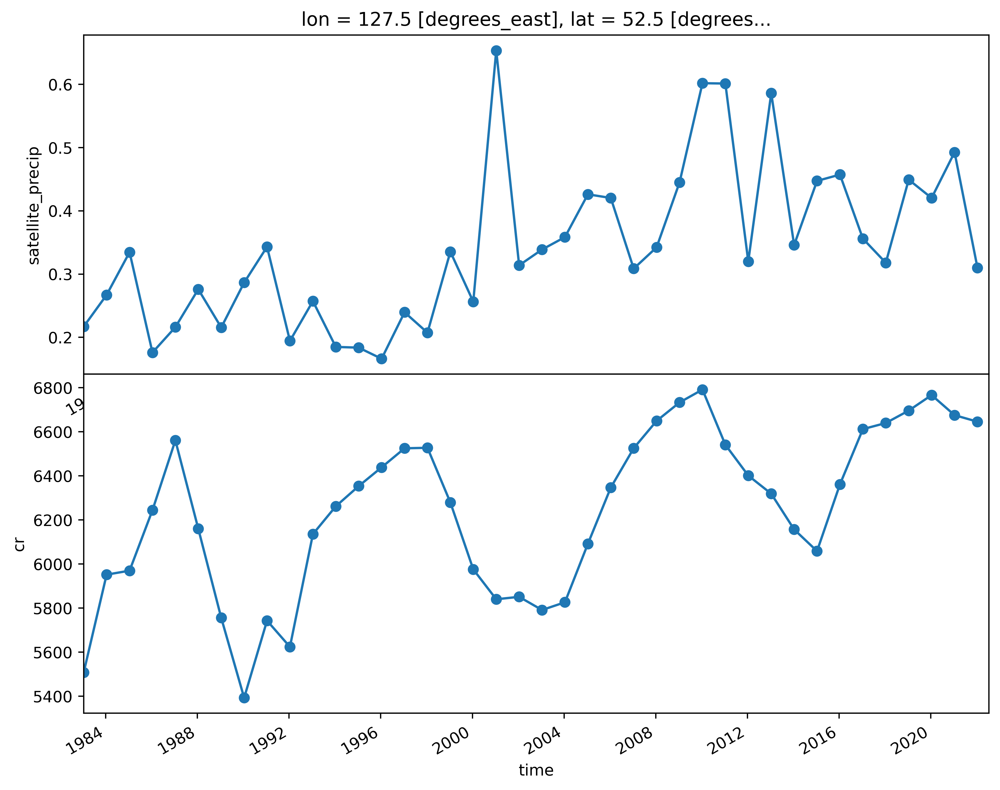

In [212]:
month = 1
rand_index = np.random.randint(0, winter_non_zero.lat.shape[0]-1)
lat = winter_non_zero.lat.data[rand_index]
lon = winter_non_zero.lon.data[rand_index]


fig = plt.figure(figsize=2*np.array([4, 3]), dpi=500)
gs0 = fig.add_gridspec(2, 1, wspace=0.15, hspace=0, left=0, right=1, bottom=0, top=1)


ax = fig.add_subplot(gs0[0, 0])

geo_slice = geo_data_coarse.groupby('lat')[lat].groupby('lon')[lon].groupby('time.month')
geo_slice[month]['satellite_precip'].plot(ax=ax, marker='o')

ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])


ax = fig.add_subplot(gs0[1, 0])
cr_slice = cr.groupby('time.month')
cr_slice[month]['cr'].plot(ax=ax, marker='o')

ax.set_xlim([np.min(geo_data_coarse.time.data), np.max(geo_data_coarse.time.data)])